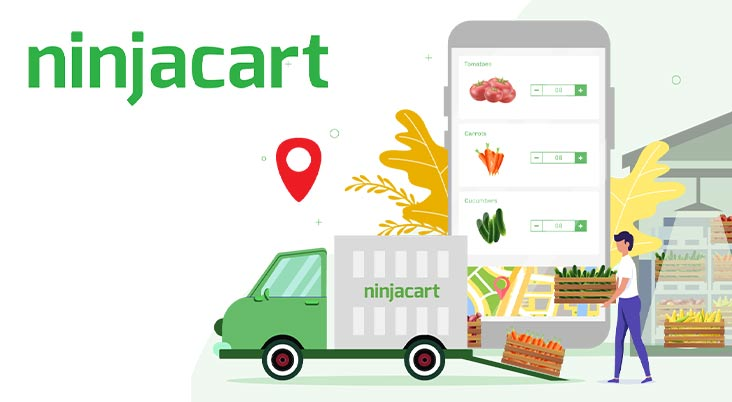

## About Ninjacart 🚛

Ninjacart is India’s leading fresh produce supply chain company, revolutionizing the way fruits and vegetables are moved from farms to stores. Founded with the vision to solve one of the world's most challenging logistical problems, Ninjacart leverages cutting-edge technology, data science, and automation to bridge the gap between farmers and retailers. The company has established a fast, reliable, and efficient supply chain capable of sourcing fresh produce directly from farmers and delivering it to retailers, restaurants, and service providers within 12 hours. This innovation not only reduces wastage but also ensures better pricing and quality for both farmers and consumers.



---



## Business Problem 💡

Ninjacart is working on developing a robust image classification system that can accurately identify different types of vegetables from images. As part of this initiative, they aim to build a multiclass classifier capable of distinguishing between images of onions, potatoes, and tomatoes, as well as identifying irrelevant or mixed-content images as noise.

The dataset provided consists of a structured collection of images divided into training and testing sets, with each set containing four categories:

*   Onions
*   Potatoes
*   Tomatoes
*   Market Scenes (to be treated as noise)

The objective is to train a computer vision model that can classify images into these four categories with high accuracy. This solution is intended to help Ninjacart streamline its sorting and categorization process, which is critical for maintaining quality and speed across its supply chain.



---



## Importing Required Libraries 🤝

In [1]:
# !pip install opencv-python
# !pip install tensorflow

In [2]:
import os
import glob
import cv2

import random
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import SGD
tf.keras.utils.set_random_seed(111)

# To supress any warnings during the flow
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'font.size': 14})


---

## Loading the Data 🔍

In [3]:
!gdown https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT

Downloading...
From (original): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
From (redirected): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT&confirm=t&uuid=a1f54c7d-3f5c-434c-8cfb-a31a0c7ae41f
To: /content/ninjacart_data.zip
100% 275M/275M [00:03<00:00, 72.2MB/s]


In [4]:
if not os.path.isdir('ninjacart_data'):
	os.system('unzip ninjacart_data.zip')

In [5]:
train_datapath = 'ninjacart_data/train/'
test_datapath = 'ninjacart_data/test/'

# Configurations:
BATCH_SIZE = 128
IMAGE_SIZE = (224, 224)
tf.random.set_seed(10)
np.random.seed(10)

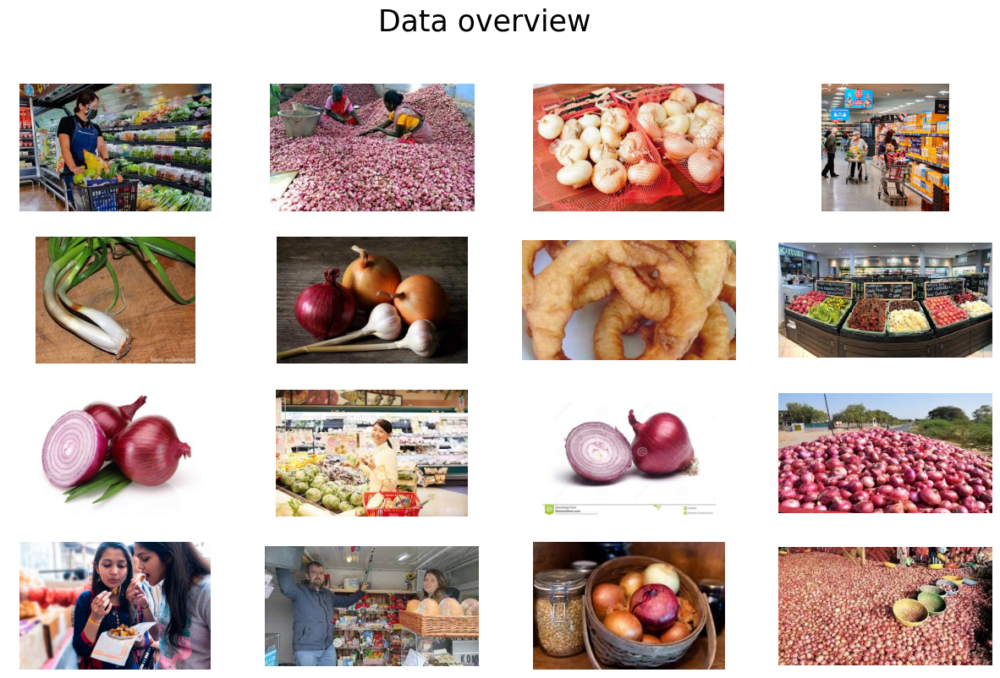

In [6]:
images = []
for folder in os.listdir(train_datapath):
  for image in os.listdir(train_datapath + '/' + folder):
    images.append(os.path.join(train_datapath, folder, image))

fig = plt.figure(1, figsize=(15, 9))
fig.suptitle('Data overview', fontsize=25)
plt.axis('off')
n = 0
for i in range(16):
  n += 1
  random_img = random.choice(images)
  imgs = tf.keras.utils.load_img(random_img)
  plt.subplot(4, 4, n)
  plt.axis('off')
  plt.imshow(imgs)

plt.show()

In [7]:
class_dirs = os.listdir(train_datapath)
image_dict = {}
count_dict = {}

for cls in class_dirs:
    file_paths = glob.glob(f'{train_datapath}{cls}/*')
    count_dict[cls] = len(file_paths)
    image_path = random.choice(file_paths)
    image_dict[cls] = tf.keras.utils.load_img(image_path)

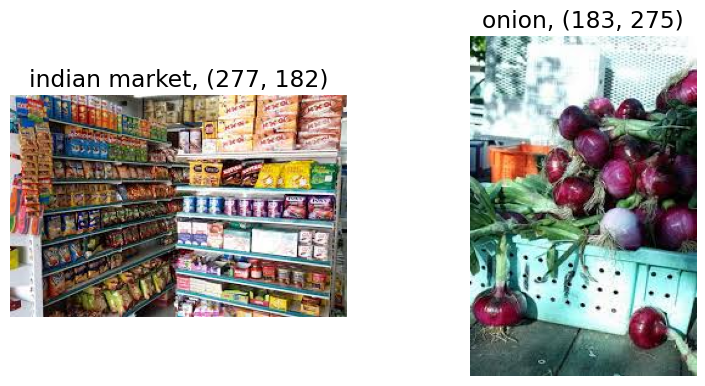

In [8]:
plt.figure(figsize=(20, 15))
for i, (cls,img) in enumerate(image_dict.items()):
    ax = plt.subplot(3, 4, i + 1)
    plt.imshow(img)
    plt.title(f'{cls}, {img.size}')
    plt.axis("off")

## Class Distribution Analysis 📊

Count of training samples per class:
            class  count
0  indian market    599
1          onion    730


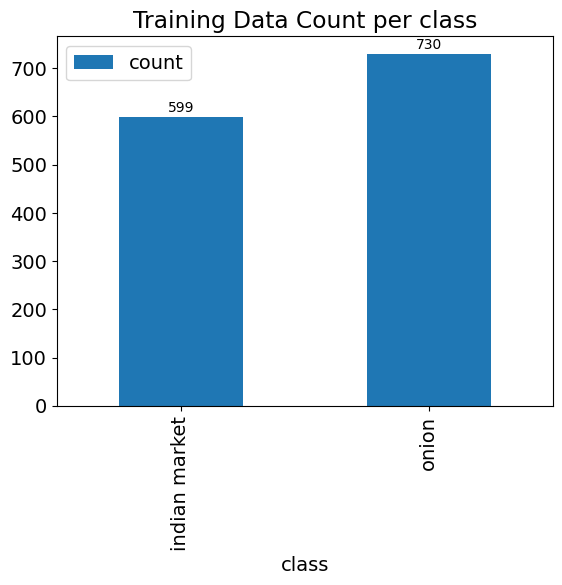

In [9]:
df_count_train = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict.values(),   # value of count_dict contain counts of each class
})
print("Count of training samples per class:\n", df_count_train)

# draw a bar plot using pandas in-built plotting function
df_count_train.plot.bar(x='class', y='count', title="Training Data Count per class")
for i, v in enumerate(df_count_train['count']):
    # add value labels on top of each bar
    plt.text(i, v + 5, str(v), ha='center', va='bottom', fontsize=10)

Count of training samples per class:
            class  count
0         potato     81
1  indian market     81
2         tomato    106
3          onion     83


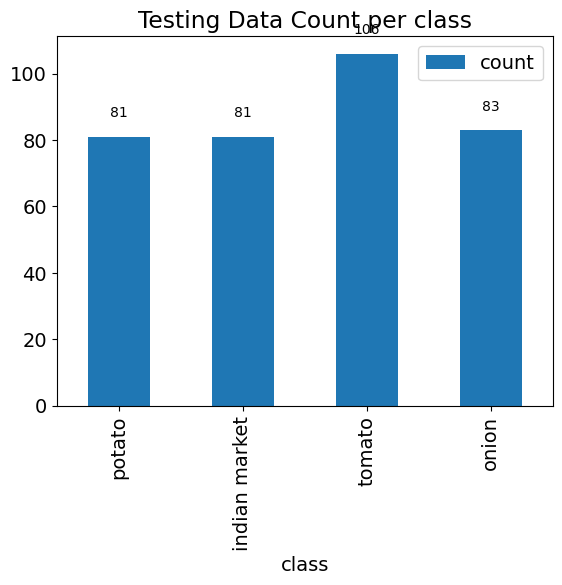

In [10]:
class_dirs = os.listdir(test_datapath)
image_dict = {}
count_dict = {}

for cls in class_dirs:
    file_paths = glob.glob(f'{test_datapath}{cls}/*')
    count_dict[cls] = len(file_paths)
    image_path = random.choice(file_paths)
    image_dict[cls] = tf.keras.utils.load_img(image_path)

## Let's now Plot the Data Distribution of Testing Data across Classes
df_count_train = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict.values(),   # value of count_dict contain counts of each class
})
print("Count of training samples per class:\n", df_count_train)

# draw a bar plot using pandas in-built plotting function
df_count_train.plot.bar(x='class', y='count', title="Testing Data Count per class")
for i, v in enumerate(df_count_train['count']):
    # add value labels on top of each bar
    plt.text(i, v + 5, str(v), ha='center', va='bottom', fontsize=10)

### Observation 👨‍🔬

*   Number of images in the Training folder matches the reported number.
*   Number of images in the Testing folder matches the reported number.
  *   potato has 83 images, where as reported as 81 images
  *   onion has 81 images, where as reported as 83 images
*   Images are not all of uniform dimensions.



---




## Utility Functions

In [11]:
def split_dataset(dataset_path, train_ratio=0.8, output_path='ninjacart_data/split/'):
    class_names = os.listdir(dataset_path)

    if not os.path.exists(output_path):
        os.makedirs(output_path)

    for class_dir in class_names:
        class_dir_path = os.path.join(dataset_path, class_dir)
        images = glob.glob(os.path.join(class_dir_path, '*.*'))

        random.shuffle(images)  # Shuffle the images

        split_index = int(len(images) * train_ratio)
        train_images = images[:split_index]
        val_images = images[split_index:]

        # Create directories for training and validation sets
        train_class_dir = os.path.join(output_path, 'train', class_dir)
        val_class_dir = os.path.join(output_path, 'val', class_dir)

        if not os.path.exists(train_class_dir):
            os.makedirs(train_class_dir)
        if not os.path.exists(val_class_dir):
            os.makedirs(val_class_dir)

        # Move images to respective directories
        for img_path in train_images:
            img_name = os.path.basename(img_path)
            new_img_path = os.path.join(train_class_dir, img_name)
            cv2.imwrite(new_img_path, cv2.imread(img_path))

        for img_path in val_images:
            img_name = os.path.basename(img_path)
            new_img_path = os.path.join(val_class_dir, img_name)
            cv2.imwrite(new_img_path, cv2.imread(img_path))

# Split the resized dataset into training and validation sets
split_dataset('ninjacart_data/train/', train_ratio=0.8, output_path='ninjacart_data/split/')

In [12]:
train_ds = tf.keras.utils.image_dataset_from_directory("ninjacart_data/split/train/",shuffle =True, seed=123,image_size=IMAGE_SIZE,batch_size=BATCH_SIZE)
val_ds   = tf.keras.utils.image_dataset_from_directory("ninjacart_data/split/val/",shuffle =False, seed=123,image_size=IMAGE_SIZE,batch_size=BATCH_SIZE)
test_ds = tf.keras.utils.image_dataset_from_directory("ninjacart_data/test/",shuffle =False, seed=123,image_size=IMAGE_SIZE,batch_size=BATCH_SIZE)

data_preprocess = tf.keras.Sequential(
    name="data_preprocess",
    layers=[ layers.Rescaling(1.0/255),]
)

# Perform Data Processing on the train, val, test dataset
train_ds = train_ds.map(lambda x, y: (data_preprocess(x), y))
val_ds = val_ds.map(lambda x, y: (data_preprocess(x), y))
test_ds = test_ds.map(lambda x, y: (data_preprocess(x), y))

Found 1063 files belonging to 2 classes.
Found 266 files belonging to 2 classes.
Found 351 files belonging to 4 classes.


In [13]:
def training_plot(metrics, history):
  f, ax = plt.subplots(1, len(metrics), figsize=(5*len(metrics), 5))
  for idx, metric in enumerate(metrics):
    ax[idx].plot(history.history[metric], ls='dashed')
    ax[idx].set_xlabel("Epochs")
    ax[idx].set_ylabel(metric)
    ax[idx].plot(history.history['val_' + metric]);
    ax[idx].legend([metric, 'val_' + metric])

In [14]:
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

def get_class_names(dataset_path):
    class_names = os.listdir(dataset_path)
    return class_names

def get_test_labels(test_ds):
    y_true = []
    for _, labels in test_ds:
        y_true.extend(labels.numpy())
    return np.array(y_true)

In [15]:
noise_path = 'ninjacart_data/test/indian market'
onion_path = 'ninjacart_data/test/onion'
potato_path = 'ninjacart_data/test/potato'
tomato_path = 'ninjacart_data/test/tomato'

# class_names = ['potato', 'indian market', 'tomato', 'onion']
class_names = ['indian market', 'onion','potato', 'tomato']
# class_names = get_class_names(test_datapath)


def classwise_accuracy(class_path, class_name, model_name) :
    paths = []
    for i in os.listdir(class_path):
        paths.append(class_path + "/" + str(i))

    correct = 0
    total = 0

    for i in range(len(paths)):
        total+= 1

        img = tf.keras.utils.load_img(paths[i])
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (224, 224))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose=0)
        if tf.argmax(pred[0]) == class_names.index(f"{class_name}"):
            correct+= 1

    print(f"Accuracy for class {class_name} is {round((correct/total)*100, 2)}% consisting of {len(paths)} images")

In [16]:
def grid_test_model(model_name):

  fig = plt.figure(1, figsize=(17, 11))
  plt.axis('off')
  n = 0
  for i in range(8):
    n += 1

    img_0 = tf.keras.utils.load_img(random.choice(test_images))
    img_0 = tf.keras.utils.img_to_array(img_0)
    img_0 = tf.image.resize(img_0, (224, 224))
    img_1 = tf.expand_dims(img_0, axis = 0)

    pred = model_name.predict(img_1)
    predicted_label = tf.argmax(pred, 1).numpy().item()

    for item in pred :
      item = tf.round((item*100))

    plt.subplot(2, 4, n)
    plt.axis('off')
    plt.title(f'prediction : {class_names[predicted_label]}\n\n'
              f'{item[0]} % {class_names[0]}\n'
              f'{item[1]} % {class_names[1]}\n'
              f'{item[2]} % {class_names[2]}\n'
              f'{item[3]} % {class_names[3]}\n')
    plt.imshow(img_0/255)
  plt.show()



---



## Custom CNN Model

In [17]:
def create_cnn_classifier(input_shape=(224, 224, 3), num_classes=10):
    model = tf.keras.models.Sequential()

    # First Convolutional Layer
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))

    # Second Convolutional Layer
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Third Convolutional Layer
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Flatten the output and add Dense layers
    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))  # Dropout for regularization
    model.add(layers.Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model

input_shape = (224, 224, 3)  # Image dimensions
num_classes = 4  # Number of classes in your dataset
cnn_model = create_cnn_classifier(input_shape, num_classes)

# Summary of the model
cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,476 (42.61 MB)

 Trainable params: 11,169,476 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

{'name': 'SGD', 'learning_rate': 0.004999999888241291, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'momentum': 0.99, 'nesterov': False}
Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step - accuracy: 0.4004 - loss: 1.0381 - val_accuracy: 0.5489 - val_loss: 0.9031
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 16s 545ms/step - accuracy: 0.5361 - loss: 0.8439 - val_accuracy: 0.5451 - val_loss: 0.7872
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 604ms/step - accuracy: 0.5293 - loss: 0.7851 - val_accuracy: 0.5489 - val_loss: 0.6845
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 11s 660ms/step - accuracy: 0.5586 - loss: 0.7378 - val_accuracy: 0.8120 - val_loss: 0.6751
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 534ms/step - accuracy: 0.5880 - loss: 0.6963 - val_accuracy: 0.5075 - val_loss: 0.6740
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 663ms/step - accur

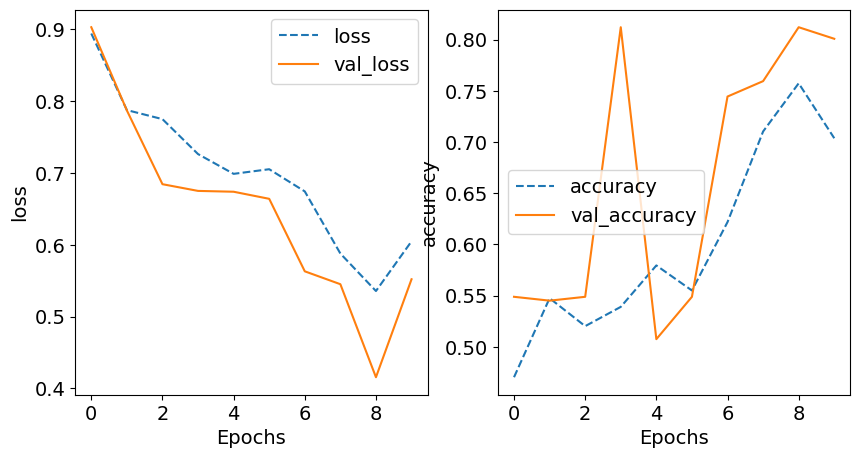

In [18]:
log_dir = "logs/Custom_CNN"
tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

opt = SGD(learning_rate=0.005, momentum=0.99)
cnn_model.compile(
    optimizer=opt,
    loss = 'sparse_categorical_crossentropy',
    metrics=['accuracy']
)
print(cnn_model.optimizer.get_config())
history = cnn_model.fit(train_ds,  epochs=10,
                    validation_data=val_ds,
                    callbacks=[tensorboard_cb]
                   )
training_plot(['loss', 'accuracy'], history)

In [19]:
# Evaluate the model
loss, acc = cnn_model.evaluate(test_ds, verbose=2)
print("Accuracy: {:5.2f}%".format(100 * acc))

3/3 - 4s - 1s/step - accuracy: 0.3362 - loss: 3.0266
Accuracy: 33.62%


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


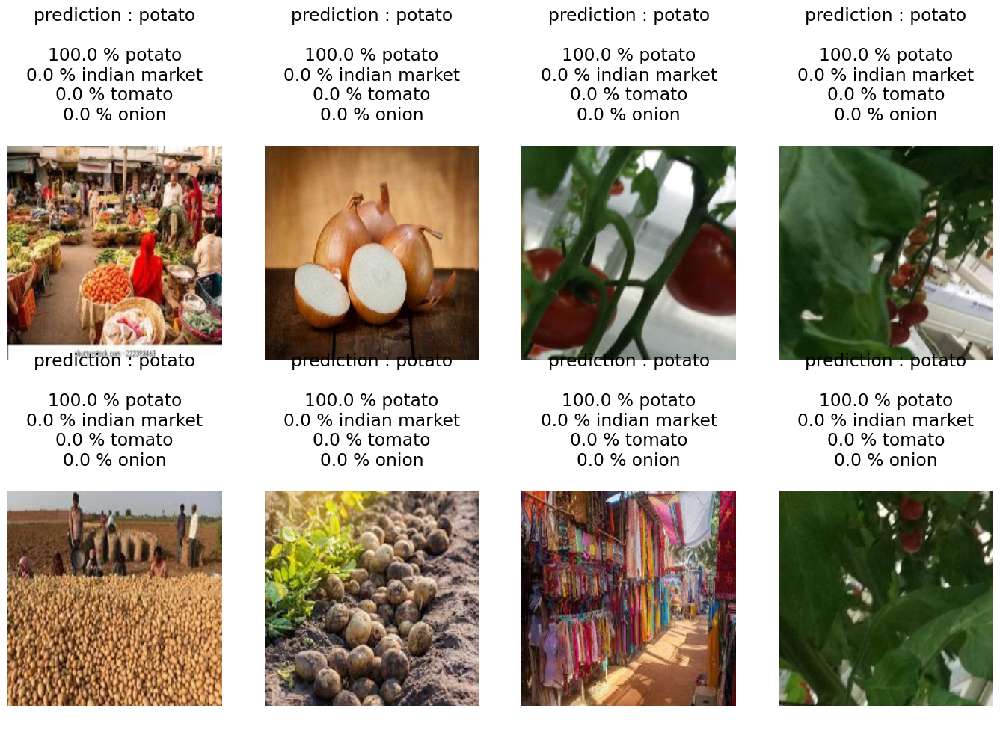

In [20]:
test_images = []

test_dir = 'ninjacart_data/test/'
class_names = os.listdir(test_dir)
for folder in os.listdir(test_dir):

  for image in os.listdir(test_dir + '/' + folder):
    test_images.append(os.path.join(test_dir, folder, image))

grid_test_model(cnn_model)

In [21]:
classwise_accuracy(noise_path, 'indian market', cnn_model)
classwise_accuracy(onion_path, 'onion', cnn_model)
classwise_accuracy(potato_path, 'potato', cnn_model)
classwise_accuracy(tomato_path, 'tomato', cnn_model)

Accuracy for class indian market is 0.0% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 100.0% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step


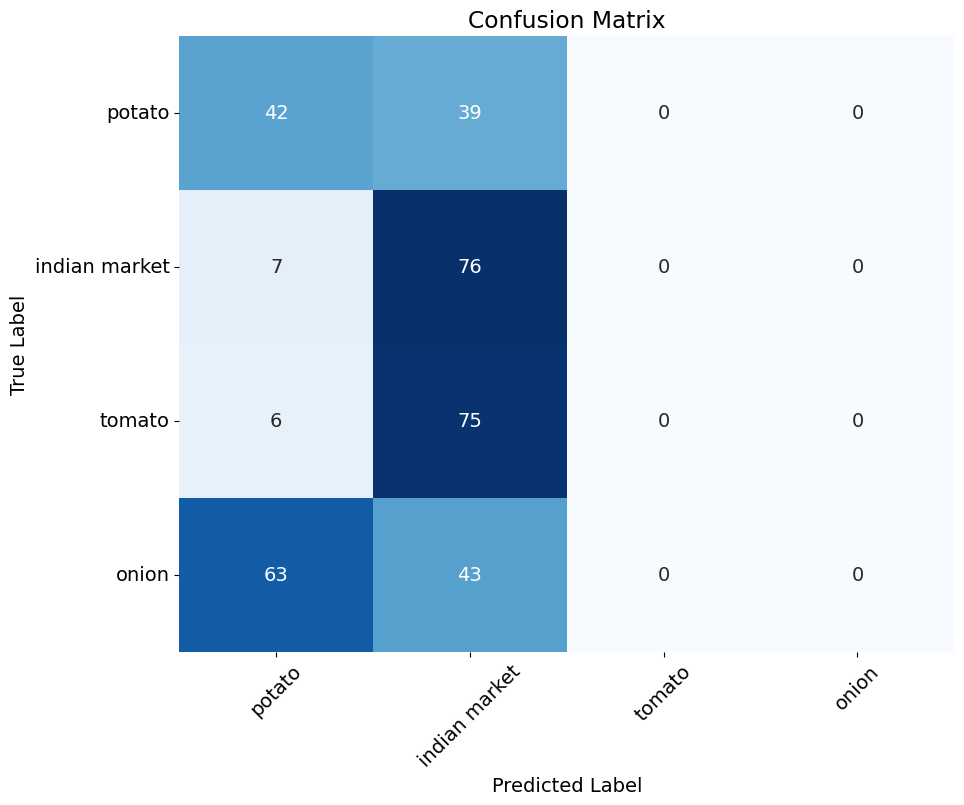

               precision    recall  f1-score   support

       potato       0.36      0.52      0.42        81
indian market       0.33      0.92      0.48        83
       tomato       0.00      0.00      0.00        81
        onion       0.00      0.00      0.00       106

     accuracy                           0.34       351
    macro avg       0.17      0.36      0.23       351
 weighted avg       0.16      0.34      0.21       351



In [22]:
# Get class names from the test dataset
class_names = get_class_names(test_datapath)
# Get true labels from the test dataset
y_true = get_test_labels(test_ds)
# Get predictions from the model (predict on the whole dataset at once)
y_pred_probs = cnn_model.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)
# Plot confusion matrix
plot_confusion_matrix(y_true, y_pred, class_names)
print(classification_report(y_true, y_pred, target_names=class_names))

## CNN - Overfitting Handling

In [23]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_tuned_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_tuned_ds   = val_ds.prefetch(AUTOTUNE)
test_tuned_ds  = test_ds.prefetch(AUTOTUNE)

In [24]:
def create_revamp_cnn_classifier(input_shape=(224, 224, 3), num_classes=10):
    model = tf.keras.models.Sequential()

    # First Convolutional Layer
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))

    # Second Convolutional Layer
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Third Convolutional Layer
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Flatten the output and add Dense layers
    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))  # Dropout for regularization
    model.add(layers.Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model

input_shape = (224, 224, 3)  # Image dimensions
num_classes = 4  # Number of classes in your dataset
revamp_cnn_model = create_revamp_cnn_classifier(input_shape, num_classes)

# Summary of the model
revamp_cnn_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,476 (42.61 MB)

 Trainable params: 11,169,476 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

{'name': 'SGD', 'learning_rate': 0.004999999888241291, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'momentum': 0.99, 'nesterov': False}
Epoch 1/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.4074 - loss: 1.1263 - val_accuracy: 0.5489 - val_loss: 0.7068
Epoch 2/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.5645 - loss: 0.7784 - val_accuracy: 0.5489 - val_loss: 0.6819
Epoch 3/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.5324 - loss: 0.7429 - val_accuracy: 0.5902 - val_loss: 0.6659
Epoch 4/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.5668 - loss: 0.7089 - val_accuracy: 0.4962 - val_loss: 0.6986
Epoch 5/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.5333 - loss: 0.7305 - val_accuracy: 0.5451 - val_loss: 0.6840
Epoch 6/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.5589 

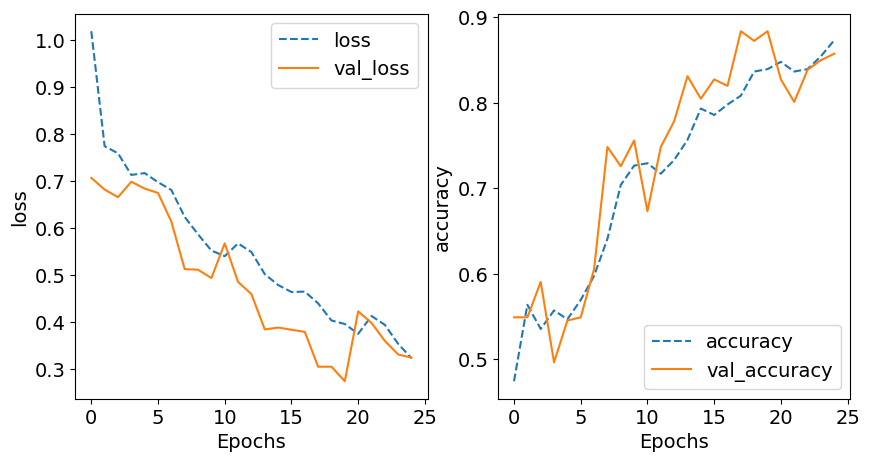

In [25]:
log_dir = "logs/Custom_Revamped_CNN"
tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("CNN_best_augmented.keras", save_best_only = True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights = True
)

opt = SGD(learning_rate=0.005, momentum=0.99)
revamp_cnn_model.compile(
    optimizer=opt,
    loss = 'sparse_categorical_crossentropy',
    metrics=['accuracy']
)
print(revamp_cnn_model.optimizer.get_config())
revamp = revamp_cnn_model.fit(train_tuned_ds,  epochs=30,
                    validation_data=val_tuned_ds,
                    callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb]
                   )

training_plot(['loss', 'accuracy'], revamp)

# Evaluate the model
loss, acc = revamp_cnn_model.evaluate(test_tuned_ds, verbose=2)
print("Accuracy: {:5.2f}%".format(100 * acc))

2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 364ms/step


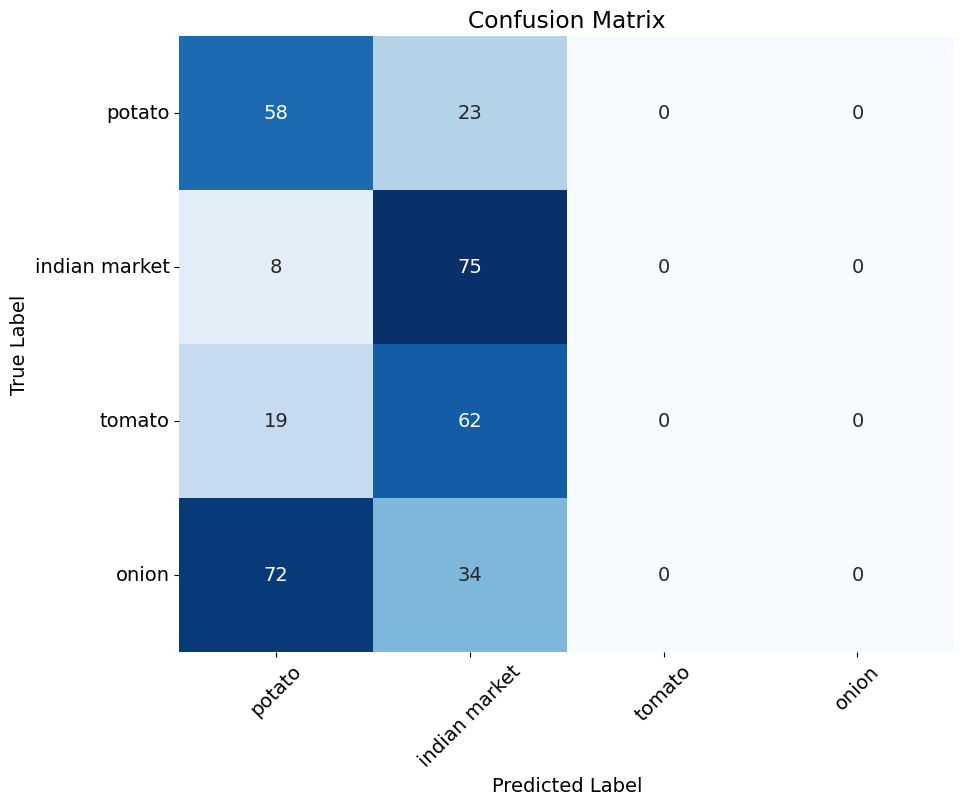

               precision    recall  f1-score   support

       potato       0.37      0.72      0.49        81
indian market       0.39      0.90      0.54        83
       tomato       0.00      0.00      0.00        81
        onion       0.00      0.00      0.00       106

     accuracy                           0.38       351
    macro avg       0.19      0.40      0.26       351
 weighted avg       0.18      0.38      0.24       351



In [26]:
# Get class names from the test dataset
class_names = get_class_names(test_datapath)
# Get true labels from the test dataset
y_true = get_test_labels(test_ds)
# Get predictions from the model (predict on the whole dataset at once)
y_pred_probs = revamp_cnn_model.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)
# Plot confusion matrix
plot_confusion_matrix(y_true, y_pred, class_names)
print(classification_report(y_true, y_pred, target_names=class_names))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


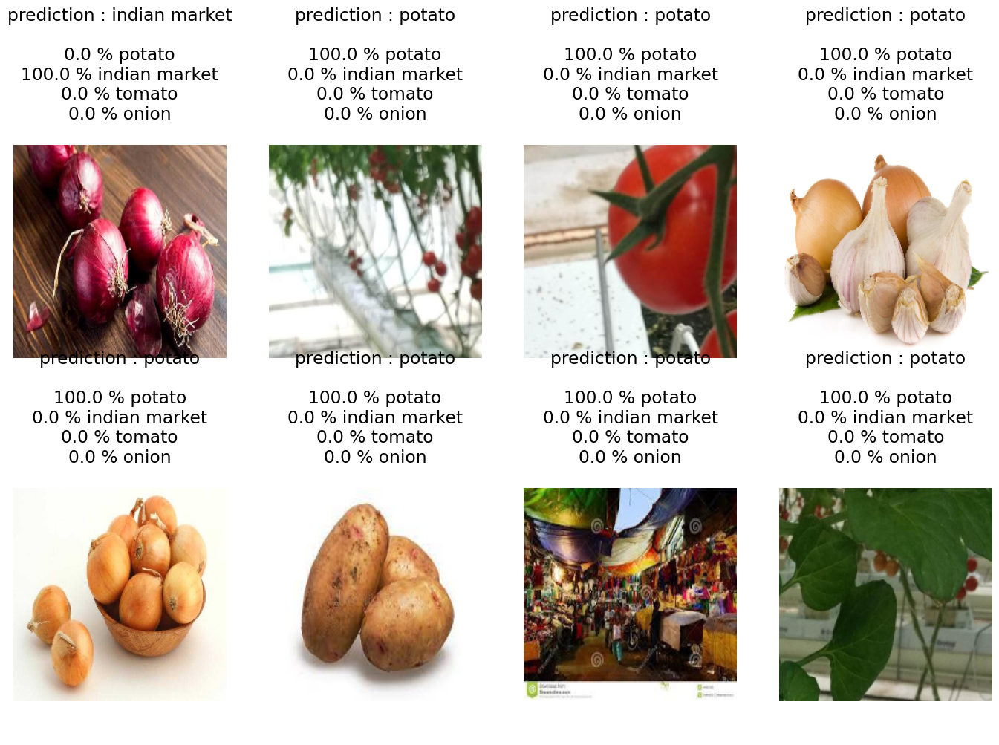

Accuracy for class indian market is 0.0% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 100.0% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


In [27]:
grid_test_model(revamp_cnn_model)

classwise_accuracy(noise_path, 'indian market', revamp_cnn_model)
classwise_accuracy(onion_path, 'onion', revamp_cnn_model)
classwise_accuracy(potato_path, 'potato', revamp_cnn_model)
classwise_accuracy(tomato_path, 'tomato', revamp_cnn_model)



---


## VGG-19

In [28]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_tuned_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_tuned_ds   = val_ds.prefetch(AUTOTUNE)
test_tuned_ds  = test_ds.prefetch(AUTOTUNE)

# load base model
base_model_vgg = tf.keras.applications.vgg19.VGG19(input_shape=(224, 224, 3), include_top = False)

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [29]:
# append classification layer
model_vgg = base_model_vgg.output
IMAGE_SIZE = (224, 224)

model_vgg = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255,  input_shape=(*IMAGE_SIZE, 3)),
            base_model_vgg,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

model_vgg.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg19 (Functional)              │ (None, 7, 7, 512)      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,026,436 (76.39 MB)

 Trainable params: 20,026,436 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

In [30]:
log_dir_vgg = "logs/VGG19"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_vgg, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("VGG19.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)
opt = SGD(learning_rate=0.005, momentum=0.99)
model_vgg.compile(
    optimizer=opt,
    loss = 'sparse_categorical_crossentropy',
    metrics=['accuracy']
)
print(model_vgg.optimizer.get_config())
history_vgg = model_vgg.fit(train_tuned_ds,  epochs=10,
                    validation_data=val_tuned_ds,
                    callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb]
                   )

{'name': 'SGD', 'learning_rate': 0.004999999888241291, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'momentum': 0.99, 'nesterov': False}
Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 226s 13s/step - accuracy: 0.5093 - loss: 1.2777 - val_accuracy: 0.4511 - val_loss: 0.7169
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - accuracy: 0.4795 - loss: 0.7613 - val_accuracy: 0.5489 - val_loss: 0.7173
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step - accuracy: 0.5484 - loss: 0.7098 - val_accuracy: 0.5489 - val_loss: 0.7003
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 39s 3s/step - accuracy: 0.5307 - loss: 0.7044 - val_accuracy: 0.5489 - val_loss: 0.6893
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - accuracy: 0.5257 - loss: 0.7048 - val_accuracy: 0.5489 - val_loss: 0.6892
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 38s 3s/step - accuracy: 0.547

3/3 - 29s - 10s/step - accuracy: 0.2365 - loss: 11.7993
Accuracy: 23.65%


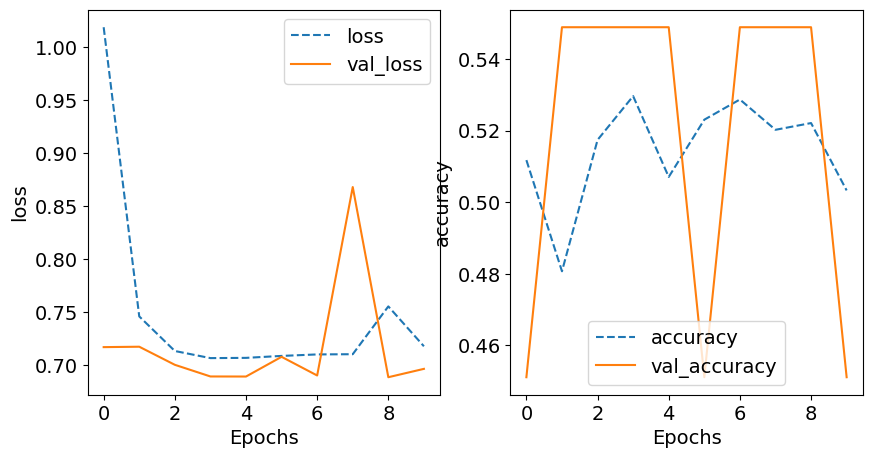

In [31]:
training_plot(['loss', 'accuracy'], history_vgg)

# Evaluate the model
loss, acc = model_vgg.evaluate(test_tuned_ds, verbose=2)
print("Accuracy: {:5.2f}%".format(100 * acc))

3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 913ms/step


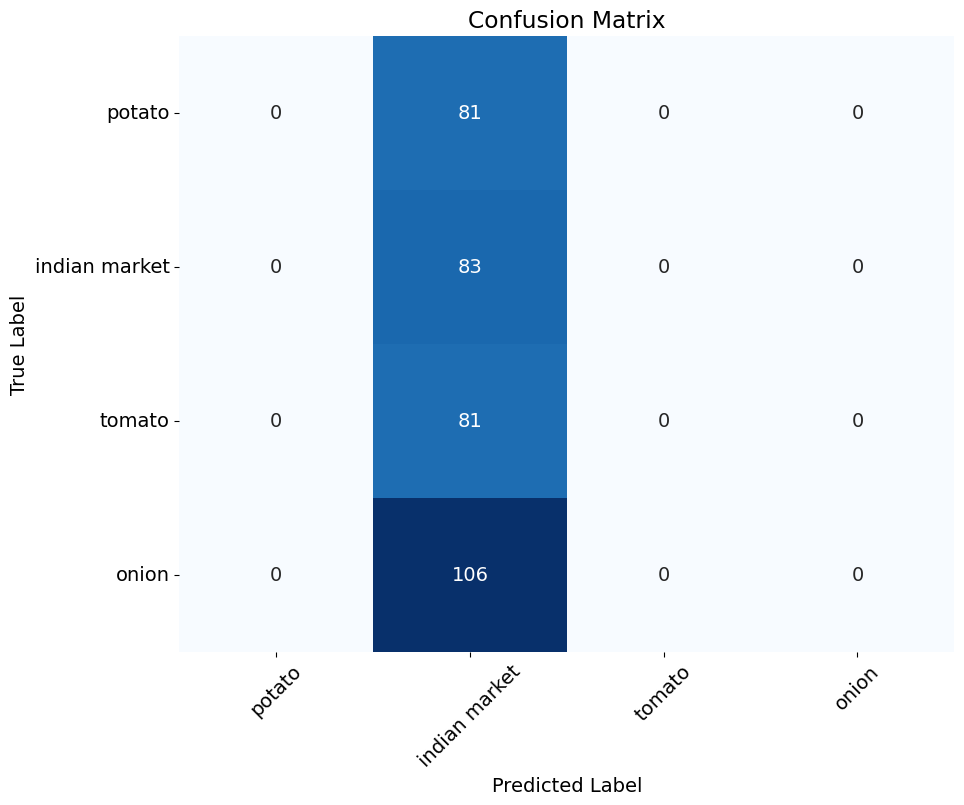

               precision    recall  f1-score   support

       potato       0.00      0.00      0.00        81
indian market       0.24      1.00      0.38        83
       tomato       0.00      0.00      0.00        81
        onion       0.00      0.00      0.00       106

     accuracy                           0.24       351
    macro avg       0.06      0.25      0.10       351
 weighted avg       0.06      0.24      0.09       351



In [32]:
# Get class names from the test dataset
class_names = get_class_names(test_datapath)
# Get true labels from the test dataset
y_true = get_test_labels(test_ds)
# Get predictions from the model (predict on the whole dataset at once)
y_pred_probs = model_vgg.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)
# Plot confusion matrix
plot_confusion_matrix(y_true, y_pred, class_names)
print(classification_report(y_true, y_pred, target_names=class_names))

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


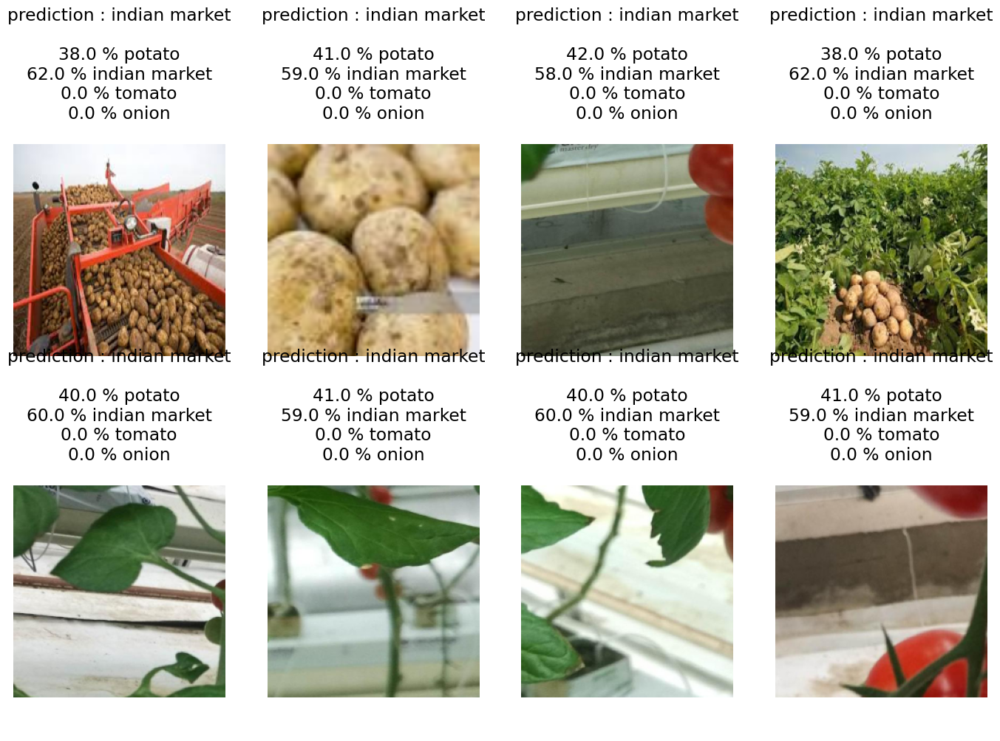

Accuracy for class indian market is 100.0% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 0.0% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


In [33]:
grid_test_model(model_vgg)

classwise_accuracy(noise_path, 'indian market', model_vgg)
classwise_accuracy(onion_path, 'onion', model_vgg)
classwise_accuracy(potato_path, 'potato', model_vgg)
classwise_accuracy(tomato_path, 'tomato', model_vgg)



---

## MobileNet Model

In [34]:
# load base model
base_model_mobile_net = tf.keras.applications.mobilenet.MobileNet(input_shape=(224, 224, 3), include_top = False)

# append classification layer
mobilenet_model = base_model_mobile_net.output

mobilenet_model = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255, input_shape=(*IMAGE_SIZE, 3)),
            base_model_mobile_net,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])
mobilenet_model.summary()

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,232,964 (12.33 MB)

 Trainable params: 3,211,076 (12.25 MB)

 Non-trainable params: 21,888 (85.50 KB)

In [35]:
log_dir_mobilenet = "logs/MobileNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_mobilenet, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("MobileNet.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

opt = SGD(learning_rate=0.005, momentum=0.99)
mobilenet_model.compile(
    optimizer=opt,
    loss = 'sparse_categorical_crossentropy',
    metrics=['accuracy']
)
print(mobilenet_model.optimizer.get_config())
history_mobilenet = mobilenet_model.fit(train_tuned_ds,  epochs=10,
                    validation_data=val_tuned_ds,
                    callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb]
                   )

{'name': 'SGD', 'learning_rate': 0.004999999888241291, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'momentum': 0.99, 'nesterov': False}
Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 63s 3s/step - accuracy: 0.6379 - loss: 0.8778 - val_accuracy: 0.5489 - val_loss: 3.1818
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.9383 - loss: 0.1962 - val_accuracy: 0.5489 - val_loss: 4.8331
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9638 - loss: 0.1394 - val_accuracy: 0.4511 - val_loss: 1.2314
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9673 - loss: 0.0877 - val_accuracy: 0.4511 - val_loss: 3.5918
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9689 - loss: 0.1345 - val_accuracy: 0.4511 - val_loss: 2.5669
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9727 

3/3 - 7s - 2s/step - accuracy: 0.2308 - loss: 7.7124
Accuracy: 23.08%


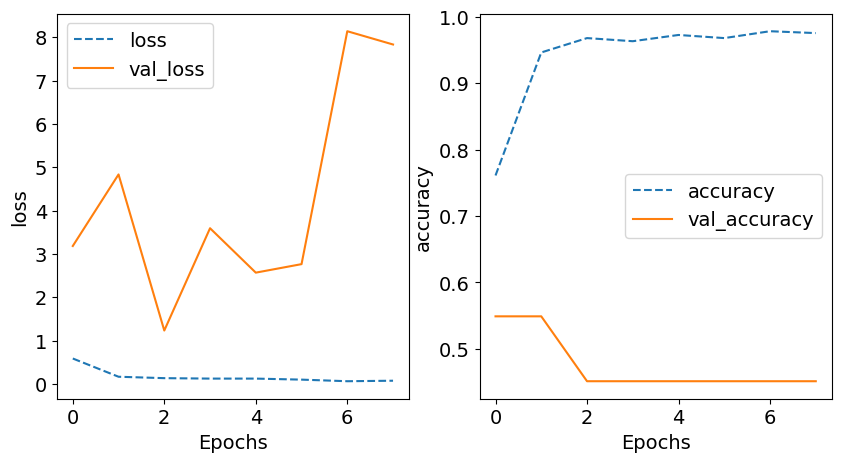

In [36]:
training_plot(['loss', 'accuracy'], history_mobilenet)

# Evaluate the model
loss, acc = mobilenet_model.evaluate(test_ds, verbose=2)
print("Accuracy: {:5.2f}%".format(100 * acc))

3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 917ms/step


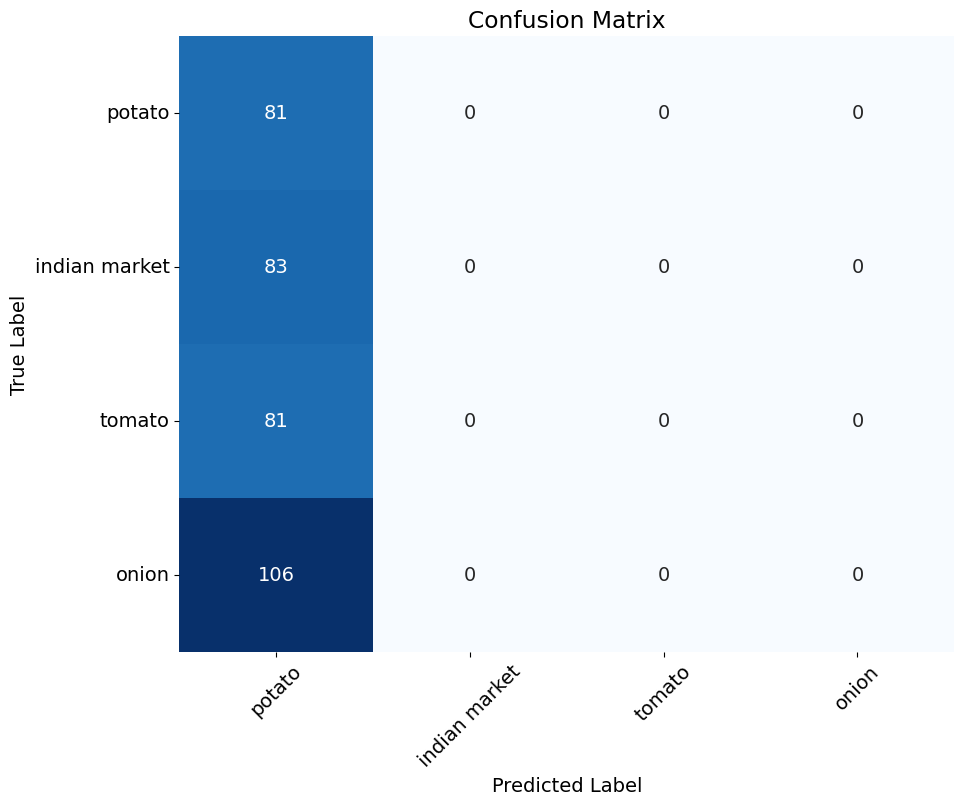

               precision    recall  f1-score   support

       potato       0.23      1.00      0.38        81
indian market       0.00      0.00      0.00        83
       tomato       0.00      0.00      0.00        81
        onion       0.00      0.00      0.00       106

     accuracy                           0.23       351
    macro avg       0.06      0.25      0.09       351
 weighted avg       0.05      0.23      0.09       351



In [37]:
# Get class names from the test dataset
class_names = get_class_names(test_datapath)
# Get true labels from the test dataset
y_true = get_test_labels(test_ds)
# Get predictions from the model (predict on the whole dataset at once)
y_pred_probs = mobilenet_model.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)
# Plot confusion matrix
plot_confusion_matrix(y_true, y_pred, class_names)
print(classification_report(y_true, y_pred, target_names=class_names))

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


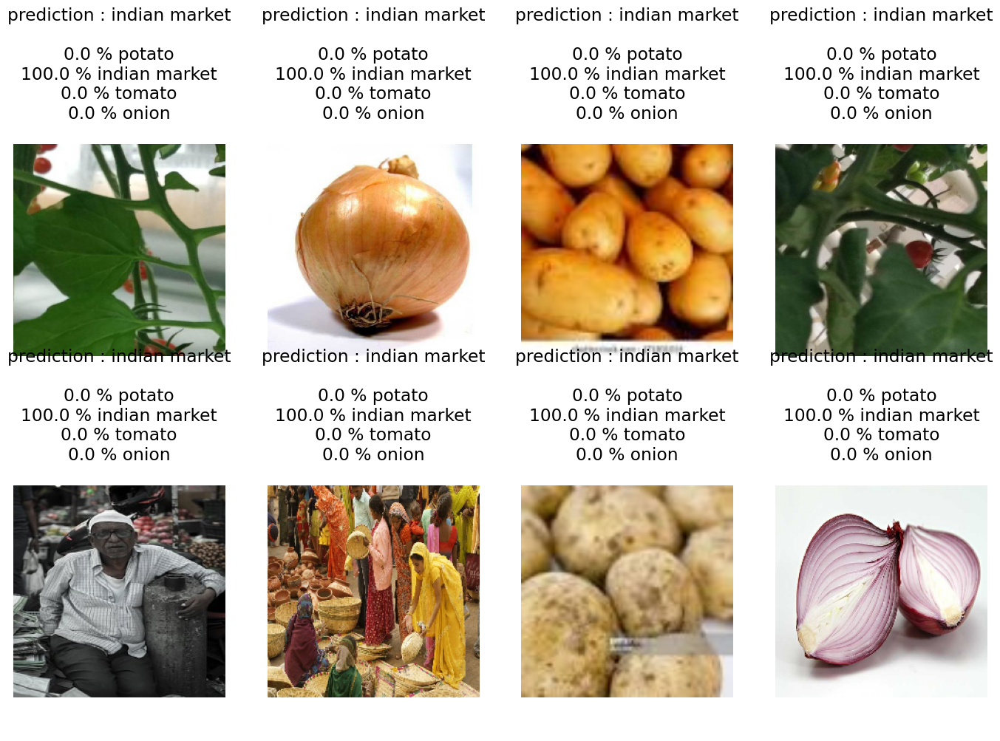

Accuracy for class indian market is 91.36% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 0.0% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


In [38]:
grid_test_model(mobilenet_model)

classwise_accuracy(noise_path, 'indian market', mobilenet_model)
classwise_accuracy(onion_path, 'onion', mobilenet_model)
classwise_accuracy(potato_path, 'potato', mobilenet_model)
classwise_accuracy(tomato_path, 'tomato', mobilenet_model)

## ResNet Model

In [39]:
# load base model
base_model_resnet = tf.keras.applications.resnet50.ResNet50(input_shape=(224, 224, 3), include_top = False)

model_resnet = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255, input_shape=(*IMAGE_SIZE, 3)),
            base_model_resnet,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

model_resnet.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4)              │         8,196 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,595,908 (90.01 MB)

 Trainable params: 23,542,788 (89.81 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [40]:
log_dir_resnet = "logs/ResNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_resnet, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("ResNet.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

opt = SGD(learning_rate=0.005, momentum=0.99)
model_resnet.compile(
    optimizer=opt,
    loss = 'sparse_categorical_crossentropy',
    metrics=['accuracy']
)
print(model_resnet.optimizer.get_config())
history_resnet = model_resnet.fit(train_tuned_ds,  epochs=10,
                    validation_data=val_tuned_ds,
                    callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb]
                   )

{'name': 'SGD', 'learning_rate': 0.004999999888241291, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'momentum': 0.99, 'nesterov': False}
Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 132s 7s/step - accuracy: 0.5880 - loss: 1.0664 - val_accuracy: 0.4511 - val_loss: 0.7501
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - accuracy: 0.9343 - loss: 0.1748 - val_accuracy: 0.4511 - val_loss: 3.5232
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - accuracy: 0.9822 - loss: 0.0525 - val_accuracy: 0.4511 - val_loss: 0.8014
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 43s 3s/step - accuracy: 0.9834 - loss: 0.0678 - val_accuracy: 0.5489 - val_loss: 4.5135
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 24s 3s/step - accuracy: 0.9872 - loss: 0.0436 - val_accuracy: 0.5489 - val_loss: 10.0558
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - accuracy: 0.987

3/3 - 10s - 3s/step - accuracy: 0.2308 - loss: 2.9250
Accuracy: 23.08%


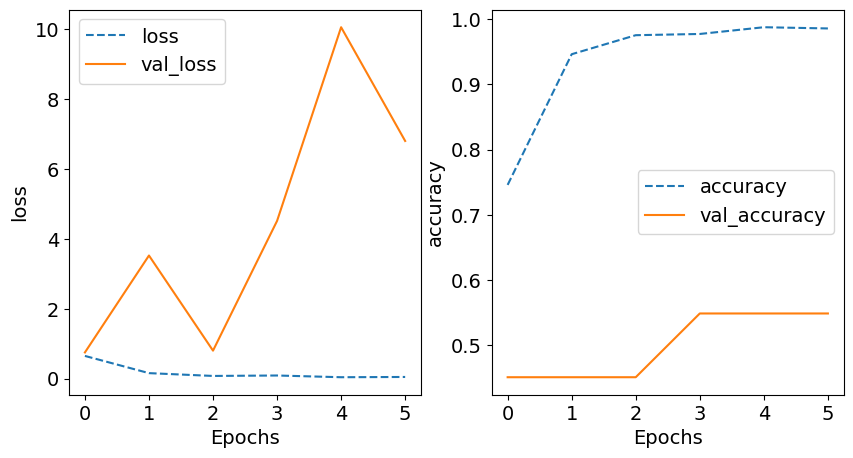

In [41]:
training_plot(['loss', 'accuracy'], history_resnet)

# Evaluate the model
loss, acc = model_resnet.evaluate(test_ds, verbose=2)
print("Accuracy: {:5.2f}%".format(100 * acc))

3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step


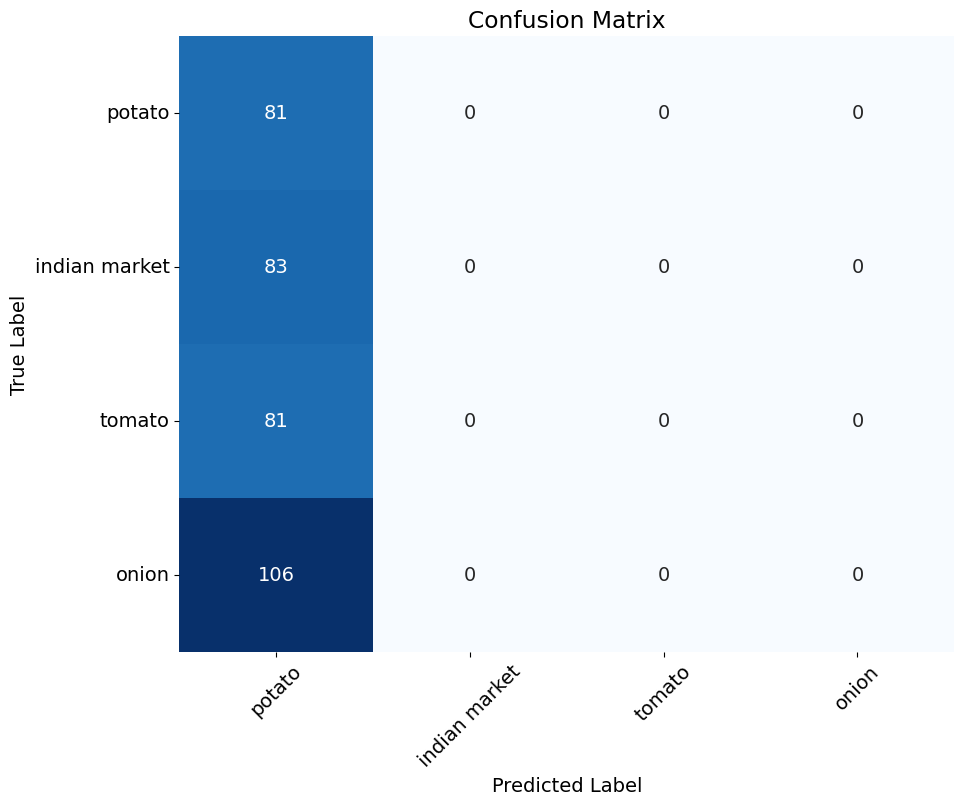

               precision    recall  f1-score   support

       potato       0.23      1.00      0.38        81
indian market       0.00      0.00      0.00        83
       tomato       0.00      0.00      0.00        81
        onion       0.00      0.00      0.00       106

     accuracy                           0.23       351
    macro avg       0.06      0.25      0.09       351
 weighted avg       0.05      0.23      0.09       351



In [42]:
# Get class names from the test dataset
class_names = get_class_names(test_datapath)
# Get true labels from the test dataset
y_true = get_test_labels(test_ds)
# Get predictions from the model (predict on the whole dataset at once)
y_pred_probs = model_resnet.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)
# Plot confusion matrix
plot_confusion_matrix(y_true, y_pred, class_names)
print(classification_report(y_true, y_pred, target_names=class_names))

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


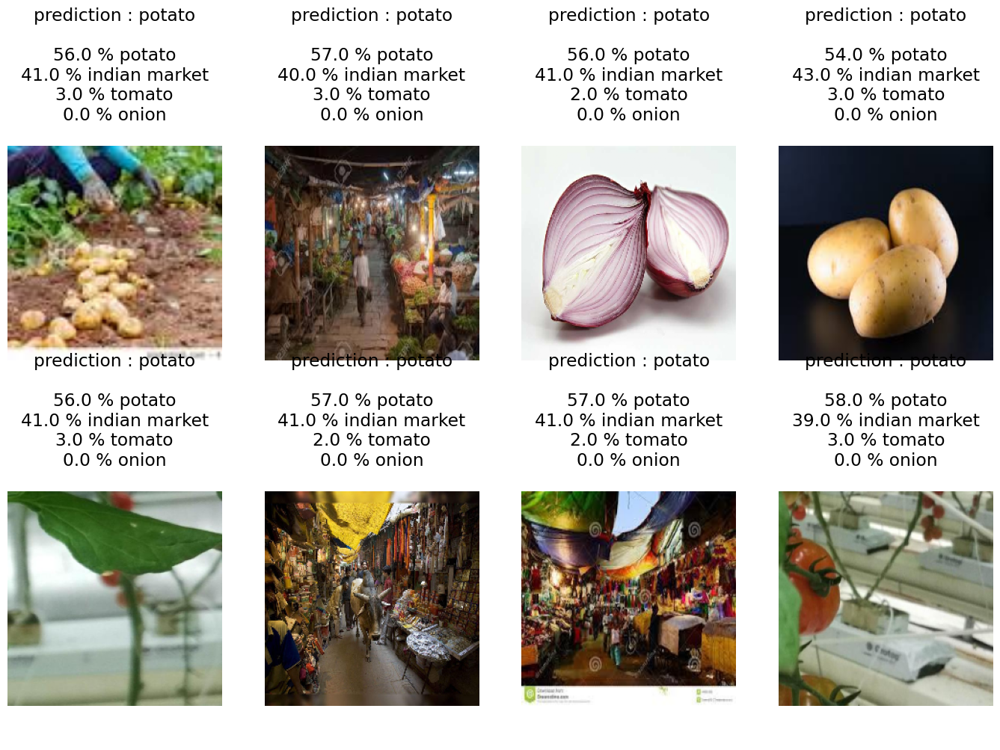

Accuracy for class indian market is 0.0% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 100.0% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


In [43]:
grid_test_model(model_resnet)

classwise_accuracy(noise_path, 'indian market', model_resnet)
classwise_accuracy(onion_path, 'onion', model_resnet)
classwise_accuracy(potato_path, 'potato', model_resnet)
classwise_accuracy(tomato_path, 'tomato', model_resnet)